In [52]:
import matplotlib.pyplot as plt # Data Visualisation
import plotly.express as px # Interactive Data Visualisation
from jupyterthemes import jtplot # Jupyternotebook theme
jtplot.style(theme = 'monokai', context = 'notebook',ticks = True, grid = 'False')
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot # Offline Version of Plotly

# Data Preprocessing
 - Dealing With Missing Data
 - Dealing With Categorical Data
 - Train & Test Split
 - Feature Scaling
 - Data Transformaiton If required
 

In [53]:
df_car = pd.read_csv(r'C:\Users\Administrator\Class Notebooks\Datasets\Linear Regression\carprice.csv')

In [54]:
df_car.head()

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model
0,BMW,4200.0,sedan,277,2.0,Petrol,yes,1991,320
1,Mercedes-Benz,7900.0,van,427,2.9,Diesel,yes,1999,Sprinter 212
2,Mercedes-Benz,13300.0,sedan,358,5.0,Gas,yes,2003,S 500
3,Audi,23000.0,crossover,240,4.2,Petrol,yes,2007,Q7
4,Toyota,18300.0,crossover,120,2.0,Petrol,yes,2011,Rav 4


In [55]:
df_car.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4345 entries, 0 to 4344
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Brand         4345 non-null   object 
 1   Price         4173 non-null   float64
 2   Body          4345 non-null   object 
 3   Mileage       4345 non-null   int64  
 4   EngineV       4195 non-null   float64
 5   Engine Type   4345 non-null   object 
 6   Registration  4345 non-null   object 
 7   Year          4345 non-null   int64  
 8   Model         4345 non-null   object 
dtypes: float64(2), int64(2), object(5)
memory usage: 305.6+ KB


In [56]:
# Exploring the descriptive statistics

In [57]:
df_car.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,4173.0,19418.746935,25584.242620,600.0,6999.0,11500.0,21700.0,300000.00
Mileage,4345.0,161.237284,105.705797,0.0,86.0,155.0,230.0,980.00
EngineV,4195.0,2.790734,5.066437,0.6,1.8,2.2,3.0,99.99
Year,4345.0,2006.550058,6.719097,1969.0,2003.0,2008.0,2012.0,2016.00


In [58]:
df_car.describe(include='O').T

,count,unique,top,freq
Brand,4345,7,Volkswagen,936
Body,4345,6,sedan,1649
Engine Type,4345,4,Diesel,2019
Registration,4345,2,yes,3947
Model,4345,312,E-Class,199


In [59]:
# Determining Variables of Interest
df_car = df_car.drop(['Model'], axis = 1)

In [60]:
df_car.describe(include='O').T

,count,unique,top,freq
Brand,4345,7,Volkswagen,936
Body,4345,6,sedan,1649
Engine Type,4345,4,Diesel,2019
Registration,4345,2,yes,3947


In [61]:
df_car['Brand'].value_counts()

Volkswagen       936
Mercedes-Benz    921
BMW              694
Toyota           541
Renault          469
Audi             457
Mitsubishi       327
Name: Brand, dtype: int64

In [62]:
df_car['Body'].value_counts()

sedan        1649
crossover     901
van           675
other         433
vagon         402
hatch         285
Name: Body, dtype: int64

In [63]:
df_car['Engine Type'].value_counts()

Diesel    2019
Petrol    1559
Gas        613
Other      154
Name: Engine Type, dtype: int64

In [64]:
pd.set_option('display.max_rows', None)

df_car[['Body','Brand']].groupby(['Brand','Body']).size()

Brand          Body     
Audi           crossover     77
               hatch         19
               other         35
               sedan        217
               vagon        108
               van            1
BMW            crossover    191
               hatch         12
               other         60
               sedan        389
               vagon         42
Mercedes-Benz  crossover    168
               hatch         23
               other        141
               sedan        385
               vagon         22
               van          182
Mitsubishi     crossover    137
               hatch         19
               other         26
               sedan        129
               vagon          8
               van            8
Renault        crossover     19
               hatch         41
               other         35
               sedan         59
               vagon        112
               van          203
Toyota         crossover    223
               

In [65]:
#pd.reset_option('display.max_rows')



In [66]:

#df_car[['Body','Brand']].groupby(['Brand','Body']).size()

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Volkswagen'),
  Text(1, 0, 'Mercedes-Benz'),
  Text(2, 0, 'BMW'),
  Text(3, 0, 'Toyota'),
  Text(4, 0, 'Renault'),
  Text(5, 0, 'Audi'),
  Text(6, 0, 'Mitsubishi')])

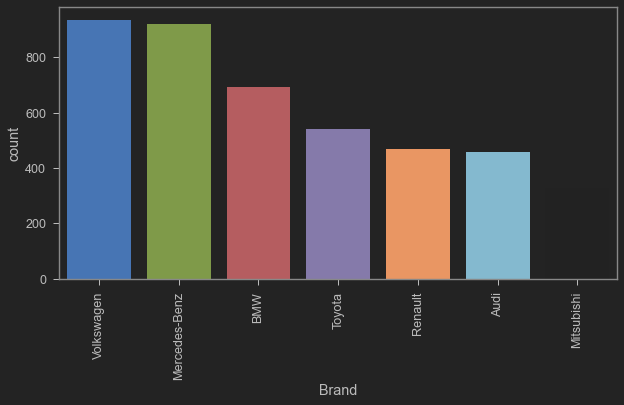

In [67]:
plt.figure(figsize= (10,5))
sns.countplot(x= 'Brand',data = df_car,order=df_car['Brand'].value_counts().index)
plt.xticks(rotation=90)

In [68]:
# Looking for nuls 
df_car.isnull().sum()

Brand             0
Price           172
Body              0
Mileage           0
EngineV         150
Engine Type       0
Registration      0
Year              0
dtype: int64

In [69]:
#If removing  less than 5% of observations 
#Remove all that has nulls

In [70]:
data_rmv = df_car.copy()

In [71]:
data_rmv.isnull().sum()

Brand             0
Price           172
Body              0
Mileage           0
EngineV         150
Engine Type       0
Registration      0
Year              0
dtype: int64

In [72]:
data_rmv.dropna(axis = 0, inplace=True)

In [73]:
data_rmv.isnull().sum()

Brand           0
Price           0
Body            0
Mileage         0
EngineV         0
Engine Type     0
Registration    0
Year            0
dtype: int64

In [74]:
# Other way is to handle nulls with mean value & max frequency

In [75]:
df_car_missing= df_car.copy()

In [76]:
df_car_missing.isnull().sum()

Brand             0
Price           172
Body              0
Mileage           0
EngineV         150
Engine Type       0
Registration      0
Year              0
dtype: int64

In [77]:
from sklearn.impute import SimpleImputer

In [78]:
df_car.columns

Index(['Brand', 'Price', 'Body', 'Mileage', 'EngineV', 'Engine Type',
       'Registration', 'Year'],
      dtype='object')

In [79]:
df_car_missing = df_car_missing.values


In [80]:
#df_car_val[:,4].shape

In [81]:
#df_car_val[:,4:5].shape

In [82]:
#df_car.head()

In [83]:
imputer1 = SimpleImputer(missing_values=np.nan, strategy='mean')
imputer1.fit(df_car_missing[:,4:5])
df_car_missing[:,4:5] = imputer1.transform(df_car_missing[:,4:5])

In [84]:
df_car_missing

array([['BMW', 4200.0, 'sedan', ..., 'Petrol', 'yes', 1991],
       ['Mercedes-Benz', 7900.0, 'van', ..., 'Diesel', 'yes', 1999],
       ['Mercedes-Benz', 13300.0, 'sedan', ..., 'Gas', 'yes', 2003],
       ...,
       ['BMW', 8000.0, 'sedan', ..., 'Petrol', 'yes', 1985],
       ['Toyota', 14200.0, 'sedan', ..., 'Petrol', 'yes', 2014],
       ['Volkswagen', 13500.0, 'van', ..., 'Diesel', 'yes', 2013]],
      dtype=object)

In [85]:
#df_car_missing1 = pd.DataFrame(df_car_missing).convert_dtypes()

In [86]:
#df_car_missing1.info()

In [87]:
df_car_tran1 = pd.DataFrame(df_car_missing, columns=['Brand', 'Price', 'Body', 'Mileage', 'EngineV', 'Engine Type',
       'Registration', 'Year']).convert_dtypes()

In [88]:
df_car_tran1.isnull().sum()

Brand             0
Price           172
Body              0
Mileage           0
EngineV           0
Engine Type       0
Registration      0
Year              0
dtype: int64

In [89]:
df_car_tran1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4345 entries, 0 to 4344
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Brand         4345 non-null   string 
 1   Price         4173 non-null   float64
 2   Body          4345 non-null   string 
 3   Mileage       4345 non-null   Int64  
 4   EngineV       4345 non-null   float64
 5   Engine Type   4345 non-null   string 
 6   Registration  4345 non-null   string 
 7   Year          4345 non-null   Int64  
dtypes: Int64(2), float64(2), string(4)
memory usage: 280.2 KB


In [90]:
df_car.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,4173.0,19418.746935,25584.242620,600.0,6999.0,11500.0,21700.0,300000.00
Mileage,4345.0,161.237284,105.705797,0.0,86.0,155.0,230.0,980.00
EngineV,4195.0,2.790734,5.066437,0.6,1.8,2.2,3.0,99.99
Year,4345.0,2006.550058,6.719097,1969.0,2003.0,2008.0,2012.0,2016.00


In [91]:
df_car_tran1.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,4173.0,19418.746935,25584.242620,600.0,6999.0,11500.0,21700.0,300000.00
Mileage,4345.0,161.237284,105.705797,0.0,86.0,155.0,230.0,980.00
EngineV,4345.0,2.790734,4.978196,0.6,1.9,2.2,3.0,99.99
Year,4345.0,2006.550058,6.719097,1969.0,2003.0,2008.0,2012.0,2016.00


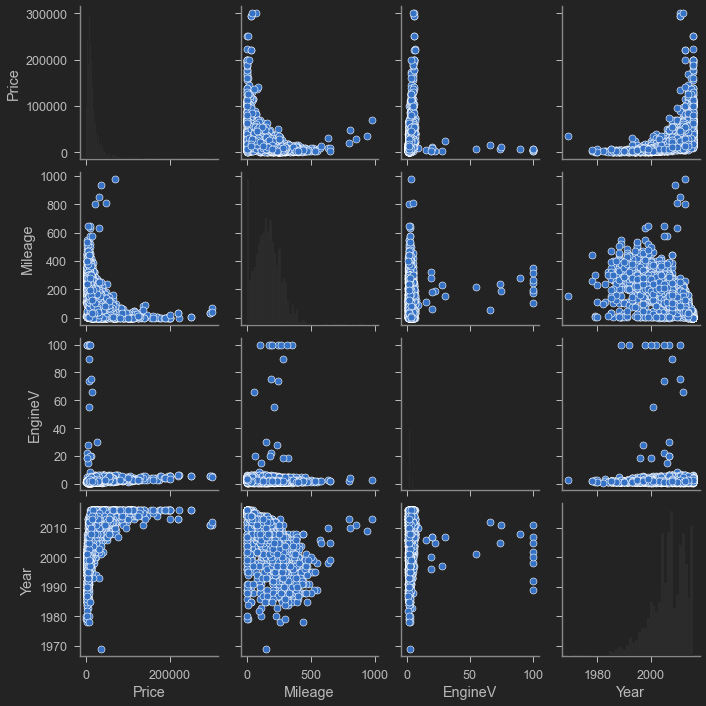

In [92]:
# Looking at the scatter plor and the histogram for all numeric columns to 
# find data pattern & data data distributions
sns.pairplot(data = df_car)

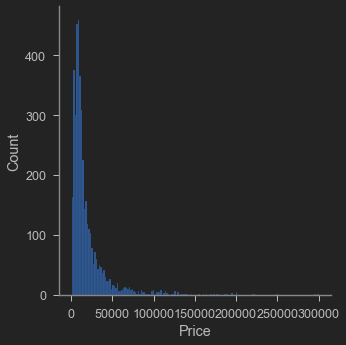

In [93]:
sns.displot(df_car['Price'])
# For better result we would be looking for a normal distributions
# here we have exponential distribution
# As it has long tail looks like it has outliers

In [94]:
# One way to deal is to remove the top 1% of observations
# Can be easily done use a quatile method
# datafra.quatile() returns the value at give quantile(= np.percentile)

In [95]:
# Want to get 99th percentile & keep the data below it

In [96]:
q = df_car['Price'].quantile(0.99)

In [97]:
q

126902.15999999919

In [98]:
car_data_u = df_car[df_car['Price']<q]

In [99]:
car_data_u

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year
0,BMW,4200.00,sedan,277,2.00,Petrol,yes,1991
1,Mercedes-Benz,7900.00,van,427,2.90,Diesel,yes,1999
2,Mercedes-Benz,13300.00,sedan,358,5.00,Gas,yes,2003
3,Audi,23000.00,crossover,240,4.20,Petrol,yes,2007
4,Toyota,18300.00,crossover,120,2.00,Petrol,yes,2011
6,BMW,6100.00,sedan,438,2.00,Gas,yes,1997
7,Audi,14200.00,vagon,200,2.70,Diesel,yes,2006
8,Renault,10799.00,vagon,193,1.50,Diesel,yes,2012
9,Volkswagen,1400.00,other,212,1.80,Gas,no,1999
10,Renault,11950.00,vagon,177,1.50,Diesel,yes,2011


In [100]:
car_data_u.describe(include = 'all')

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year
count,4131,4131.000000,4131,4131.000000,3983.000000,4131,4131,4131.000000
unique,7,NaN,6,NaN,NaN,4,2,NaN
top,Volkswagen,NaN,sedan,NaN,NaN,Diesel,yes,NaN
freq,908,NaN,1597,NaN,NaN,1895,3737,NaN
mean,NaN,17736.684812,NaN,165.622125,2.743204,NaN,NaN,2006.281288
std,NaN,18862.421137,NaN,104.213992,4.956550,NaN,NaN,6.663535
min,NaN,600.000000,NaN,0.000000,0.600000,NaN,NaN,1969.000000
25%,NaN,6900.000000,NaN,93.000000,1.800000,NaN,NaN,2002.000000
50%,NaN,11300.000000,NaN,160.000000,2.200000,NaN,NaN,2007.000000
75%,NaN,21000.000000,NaN,230.000000,3.000000,NaN,NaN,2011.000000


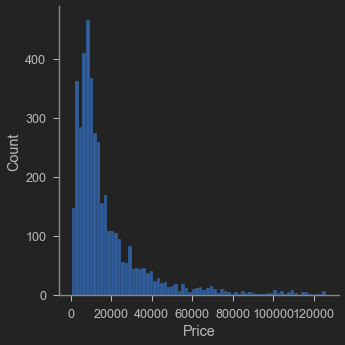

In [101]:
sns.displot(car_data_u['Price'])
# Now we have same shape or distribution now but less extreme values

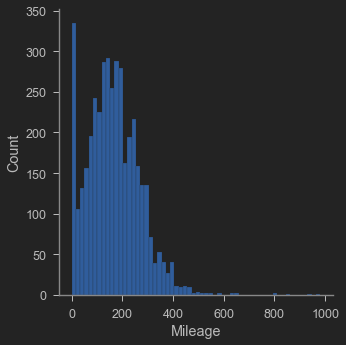

In [102]:
sns.displot(car_data_u['Mileage'])

In [103]:
# Same issue wit the milage
q = car_data_u['Mileage'].quantile(0.99)
car_data_u2 = car_data_u[car_data_u['Mileage']<q]

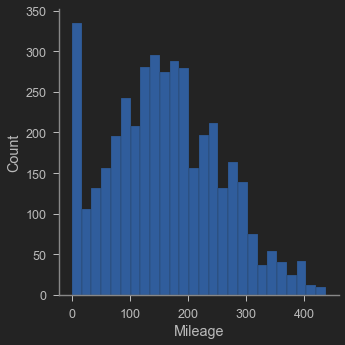

In [104]:
sns.displot(car_data_u2['Mileage'])

In [105]:
car_data_u2.describe()

,Price,Mileage,EngineV,Year
count,4088.000000,4088.000000,3944.000000,4088.000000
mean,17817.635753,161.649217,2.746851,2006.371820
std,18896.159502,96.248405,4.980291,6.591526
min,600.000000,0.000000,0.600000,1969.000000
25%,6999.000000,92.000000,1.800000,2003.000000
50%,11499.500000,158.000000,2.200000,2007.000000
75%,21000.000000,230.000000,3.000000,2011.000000
max,126000.000000,438.000000,99.990000,2016.000000


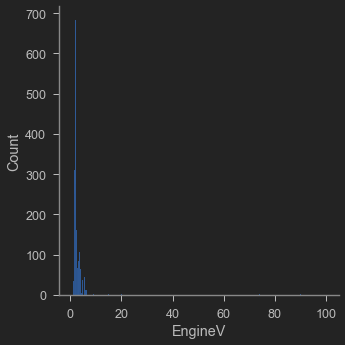

In [106]:
sns.displot(car_data_u2['EngineV'])
# Enginve values are wrong not just extreme # 
# It has many 99 values. Looks like mssing value is replaced by 99
# Just by googling we can find that engine volume should normally fall in 0.6 & 6.5

In [107]:
car_data_u3 = car_data_u2[car_data_u2['EngineV']<6.5]

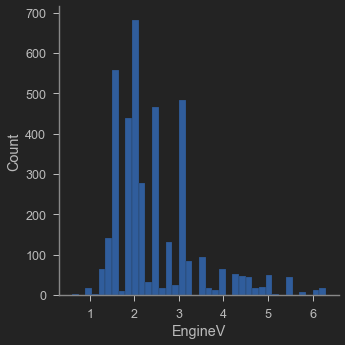

In [108]:
sns.displot(car_data_u3['EngineV'])

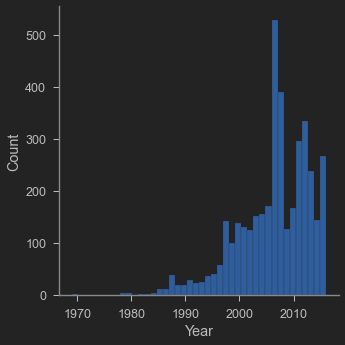

In [109]:
sns.displot(car_data_u3['Year'])
# We ahve the problem at teh low end. Most of the cars are new but some are vintage cars

In [110]:
car_data_u3['Year'].value_counts()

2008    390
2012    334
2007    330
2011    296
2013    237
2006    198
2016    185
2005    171
2010    166
2004    156
2003    151
2014    143
2000    138
2001    131
2009    127
2002    124
1999     99
2015     82
1998     72
1997     70
1996     58
1995     40
1994     36
1991     28
1993     25
1992     23
1988     20
1989     19
1987     18
1990     18
1985     11
1986     11
1980      3
1979      3
1984      3
1983      2
1969      1
1982      1
1978      1
Name: Year, dtype: int64

In [111]:
q = car_data_u3['Year'].quantile(0.01)
car_data_u4 = car_data_u3[car_data_u3['Year']>q]

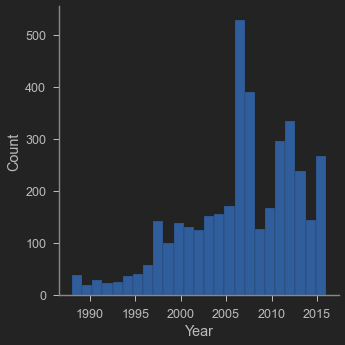

In [112]:
sns.displot(car_data_u4['Year'])

In [113]:
car_data_u4.head(20)

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year
0,BMW,4200.0,sedan,277,2.00,Petrol,yes,1991
1,Mercedes-Benz,7900.0,van,427,2.90,Diesel,yes,1999
2,Mercedes-Benz,13300.0,sedan,358,5.00,Gas,yes,2003
3,Audi,23000.0,crossover,240,4.20,Petrol,yes,2007
4,Toyota,18300.0,crossover,120,2.00,Petrol,yes,2011
6,BMW,6100.0,sedan,438,2.00,Gas,yes,1997
7,Audi,14200.0,vagon,200,2.70,Diesel,yes,2006
8,Renault,10799.0,vagon,193,1.50,Diesel,yes,2012
9,Volkswagen,1400.0,other,212,1.80,Gas,no,1999
10,Renault,11950.0,vagon,177,1.50,Diesel,yes,2011


In [114]:
car_data_clean = car_data_u4.reset_index(drop= True)

In [115]:
car_data_clean.head()

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year
0,BMW,4200.0,sedan,277,2.0,Petrol,yes,1991
1,Mercedes-Benz,7900.0,van,427,2.9,Diesel,yes,1999
2,Mercedes-Benz,13300.0,sedan,358,5.0,Gas,yes,2003
3,Audi,23000.0,crossover,240,4.2,Petrol,yes,2007
4,Toyota,18300.0,crossover,120,2.0,Petrol,yes,2011


In [116]:
car_data_clean.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Brand,3867,7,Volkswagen,848,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Price,3867,NaN,NaN,NaN,18162.6,19003.1,800,7200,11700,21650,126000
Body,3867,6,sedan,1467,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mileage,3867,NaN,NaN,NaN,160.655,95.7033,0,91,157,225.5,438
EngineV,3867,NaN,NaN,NaN,2.44966,0.948508,0.6,1.8,2.2,3,6.3
Engine Type,3867,4,Diesel,1807,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Registration,3867,2,yes,3505,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,3867,NaN,NaN,NaN,2006.7,6.10404,1988,2003,2008,2012,2016


# Assumptions

In [117]:
# Checking for Linearity

Text(0.5, 1.0, 'Price & Mileage')

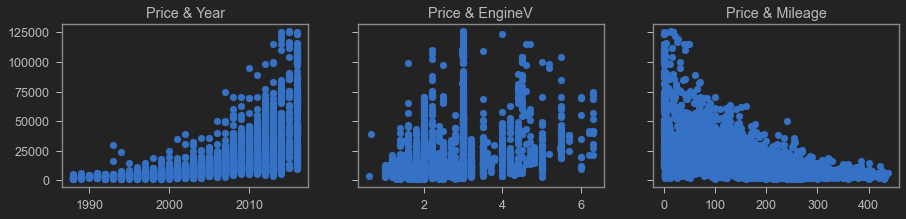

In [118]:
f, (ax1, ax2, ax3) = plt.subplots(1,3, sharey = True, figsize = (15,3))
ax1.scatter(car_data_clean['Year'],car_data_clean['Price'])
ax1.set_title('Price & Year')
ax2.scatter(car_data_clean['EngineV'],car_data_clean['Price'])
ax2.set_title('Price & EngineV')
ax3.scatter(car_data_clean['Mileage'],car_data_clean['Price'])
ax3.set_title('Price & Mileage')

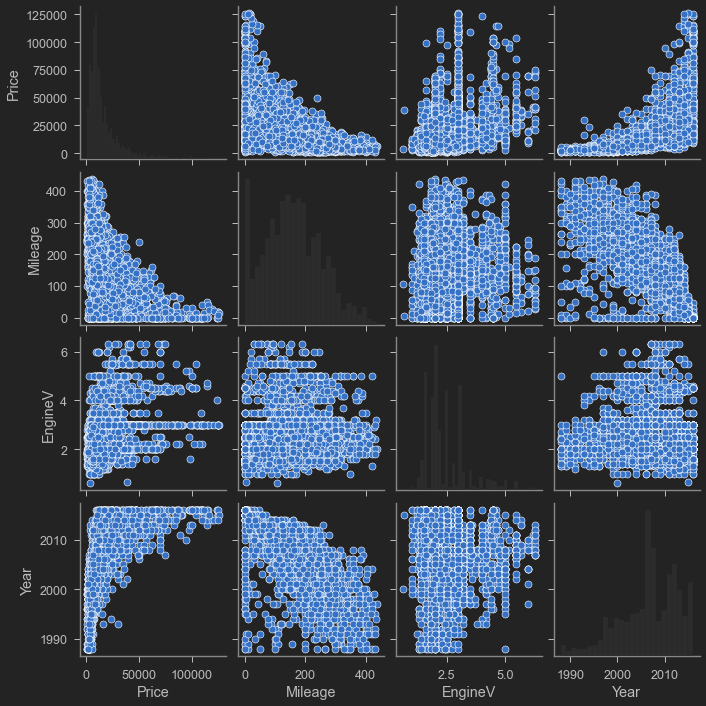

In [119]:
sns.pairplot(car_data_clean)

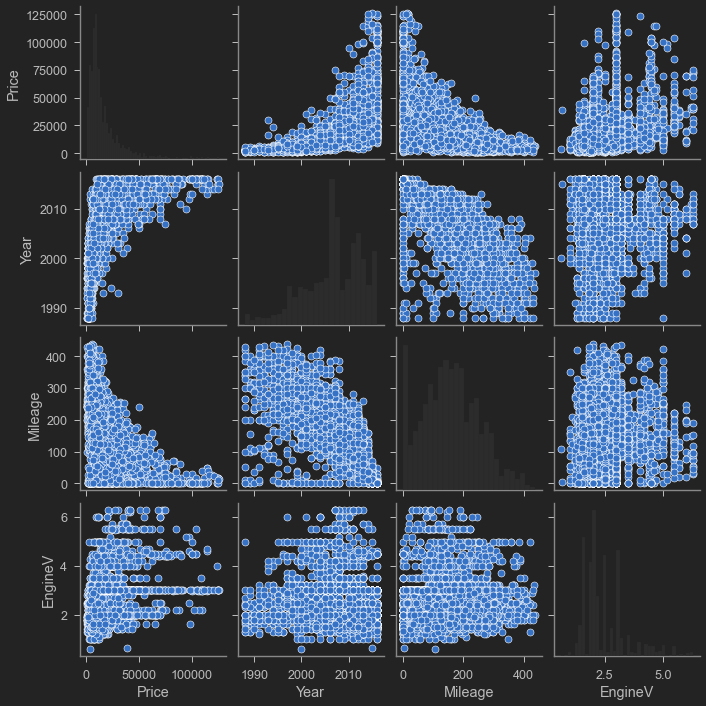

In [120]:
# from jupyterthemes import jtplot # Jupyternotebook theme
#jtplot.style(theme = 'oceans16', context = 'notebook',ticks = True, grid = 'False')
#from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot # Offline Version of Plotly
sns.pairplot(data = car_data_clean, vars=['Price','Year','Mileage','EngineV'])

In [121]:
!jt -r

Reset css and font defaults in:
C:\Users\Administrator\.jupyter\custom &
C:\Users\Administrator\AppData\Roaming\jupyter\nbextensions


In [122]:
# We see patterns but none are linear

In [123]:
# Hence we need to transform one or more variables

In [124]:
# Log transformation are very useful when facing exponential relationships

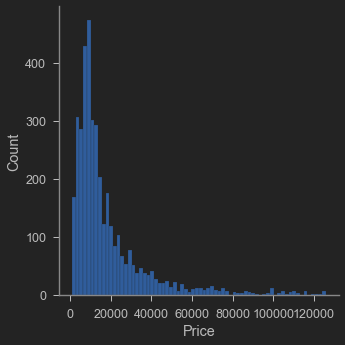

In [125]:
sns.displot(car_data_clean['Price'])
# Price is exponentially distributed
# Can need to take a log transformation

In [126]:
log_price = np.log(car_data_clean['Price'])
car_data_clean['log_price'] = log_price
car_data_clean

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,log_price
0,BMW,4200.00,sedan,277,2.00,Petrol,yes,1991,8.342840
1,Mercedes-Benz,7900.00,van,427,2.90,Diesel,yes,1999,8.974618
2,Mercedes-Benz,13300.00,sedan,358,5.00,Gas,yes,2003,9.495519
3,Audi,23000.00,crossover,240,4.20,Petrol,yes,2007,10.043249
4,Toyota,18300.00,crossover,120,2.00,Petrol,yes,2011,9.814656
5,BMW,6100.00,sedan,438,2.00,Gas,yes,1997,8.716044
6,Audi,14200.00,vagon,200,2.70,Diesel,yes,2006,9.560997
7,Renault,10799.00,vagon,193,1.50,Diesel,yes,2012,9.287209
8,Volkswagen,1400.00,other,212,1.80,Gas,no,1999,7.244228
9,Renault,11950.00,vagon,177,1.50,Diesel,yes,2011,9.388487


Text(0.5, 1.0, 'Log Price & Mileage')

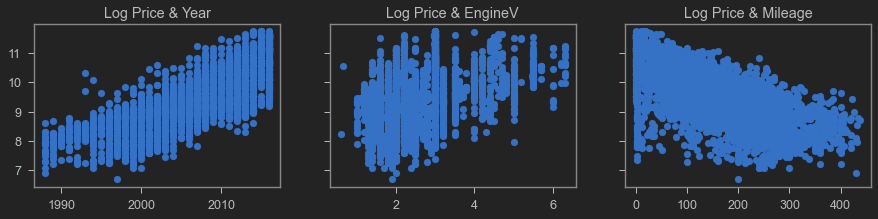

In [127]:
f, (ax1, ax2, ax3) = plt.subplots(1,3, sharey = True, figsize = (15,3))
ax1.scatter(car_data_clean['Year'],car_data_clean['log_price'])
ax1.set_title('Log Price & Year')
ax2.scatter(car_data_clean['EngineV'],car_data_clean['log_price'])
ax2.set_title('Log Price & EngineV')
ax3.scatter(car_data_clean['Mileage'],car_data_clean['log_price'])
ax3.set_title('Log Price & Mileage')

In [128]:
# Now we see linear pattern on all the plots now

In [129]:
car_data_clean = car_data_clean.drop(['Price'],axis=1)

In [130]:
 #No Endogenty - No relation in errors & independent variables 
# Will chekc after regression model is created

In [131]:
# Normality & Homoscdasticity
# Normality is assumed as we ahve big sample size following the central limit theorem
# Zero mean of distributions of error - Have taken care by including the intercept in the regression 
# Homoscdasticity - log transformation is the most common fit for homoscdasticity

In [132]:
# No Autocorrelation - As data is not coming from time series data or panel data. 

In [133]:
# COrrelation Marix
car_data_clean.corr()

,Mileage,EngineV,Year,log_price
Mileage,1.000000,0.006507,-0.715357,-0.614326
EngineV,0.006507,1.000000,-0.021033,0.410888
Year,-0.715357,-0.021033,1.000000,0.746792
log_price,-0.614326,0.410888,0.746792,1.000000


<AxesSubplot:>

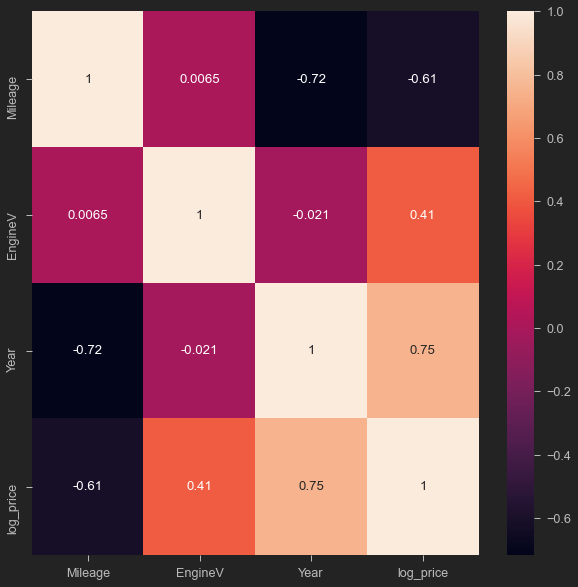

In [134]:
plt.figure(figsize= (10,10))
sns.heatmap(car_data_clean.corr(), annot=True)

In [135]:
# Multicolinearity

# logically Year & Mileage will be correlated 
# Newer the car lower the mileage. So we should expect some colliearity in the data

In [136]:
# Best way to chekc for multi collinearity is using VIF
# vif - variance inflation factor
# VIF is a measure that estimates how larger would the square root of standard error the estimate is compared to the 
# situation where the variable is completely uncorrelated with other predictors

# the most widely-used diagnostic for multicollinearity, the variance inflation factor (VIF). 
# The VIF may be calculated for each predictor by doing a linear regression of that predictor 
# on all the other predictors, and then obtaining the R2 from that regression. The VIF is just 1/(1-R2).

# It’s called the variance inflation factor because it estimates how much the variance of a coefficient is
# “inflated” because of linear dependence with other predictors. Thus, a VIF of 1.8 tells us that the 
# variance (the square of the standard error) of a particular coefficient is 80% larger than it would be
# if that predictor was completely uncorrelated with all the other predictors.


# https://en.wikipedia.org/wiki/Variance_inflation_factor
# https://statisticalhorizons.com/multicollinearity

In [137]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# For which all variables we wna tto check for multicollinearity
variables = car_data_clean[['Mileage','Year','EngineV']]
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(variables.values, i) for i in range(variables.shape[1])]
vif['features']= variables.columns

In [138]:
variables.shape[1]

3

In [139]:
variance_inflation_factor(variables.values, 0)

3.79148842802256

In [140]:
variance_inflation_factor(variables.values, 1)

10.355619377568498

In [141]:
variance_inflation_factor(variables.values, 2)

7.669946802407841

In [142]:
vif
# VIF - (1, inf)
# If we have vif = 1 then it means no multicollinearity
# 1 < VIF < 5: Perfectly Okay
# VIF year if highly collinear so will remove it

,VIF,features
0,3.791488,Mileage
1,10.355619,Year
2,7.669947,EngineV


In [143]:
car_no_mc = car_data_clean.drop(['Year'], axis = 1)

In [144]:
car_no_mc

,Brand,Body,Mileage,EngineV,Engine Type,Registration,log_price
0,BMW,sedan,277,2.00,Petrol,yes,8.342840
1,Mercedes-Benz,van,427,2.90,Diesel,yes,8.974618
2,Mercedes-Benz,sedan,358,5.00,Gas,yes,9.495519
3,Audi,crossover,240,4.20,Petrol,yes,10.043249
4,Toyota,crossover,120,2.00,Petrol,yes,9.814656
5,BMW,sedan,438,2.00,Gas,yes,8.716044
6,Audi,vagon,200,2.70,Diesel,yes,9.560997
7,Renault,vagon,193,1.50,Diesel,yes,9.287209
8,Volkswagen,other,212,1.80,Gas,no,7.244228
9,Renault,vagon,177,1.50,Diesel,yes,9.388487


In [145]:
# Encoding Categorical Data
# One Hot Encoding - Creating Binary Vectors for each of the categories
# There should not be any order in teh categories so we can have 1,2,3
# instead we want to have 0 & 1 to represent diff categories

How to use the ColumnTransformer
The ColumnTransformer is a class in the scikit-learn Python machine learning library that allows you to selectively apply data preparation transforms.

For example, it allows you to apply a specific transform or sequence of transforms to just the numerical columns, and a separate sequence of transforms to just the categorical columns.

To use the ColumnTransformer, you must specify a list of transformers.

Each transformer is a three-element tuple that defines the name of the transformer, the transform to apply, and the column indices to apply it to. For example:

(Name, Object, Columns)

In [146]:
car_cat_ct = car_no_mc.copy()

In [147]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
#ct = ColumnTransformer(transformers=[('cat', OneHotEncoder(),[0])], remainder ='passthrough' )
newct = ColumnTransformer(transformers=[('encoder', OneHotEncoder(sparse=False),[0,2,3,4])],remainder='passthrough' )

In [148]:
car_dummy = car_no_mc.copy()

In [149]:
car_dummy = pd.get_dummies(car_no_mc,drop_first = True)

In [150]:
car_dummy

,Mileage,EngineV,log_price,Brand_BMW,Brand_Mercedes-Benz,Brand_Mitsubishi,Brand_Renault,Brand_Toyota,Brand_Volkswagen,Body_hatch,Body_other,Body_sedan,Body_vagon,Body_van,Engine Type_Gas,Engine Type_Other,Engine Type_Petrol,Registration_yes
0,277,2.00,8.342840,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1
1,427,2.90,8.974618,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
2,358,5.00,9.495519,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1
3,240,4.20,10.043249,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
4,120,2.00,9.814656,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1
5,438,2.00,8.716044,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1
6,200,2.70,9.560997,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
7,193,1.50,9.287209,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
8,212,1.80,7.244228,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0
9,177,1.50,9.388487,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1


In [151]:
car_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3867 entries, 0 to 3866
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Mileage              3867 non-null   int64  
 1   EngineV              3867 non-null   float64
 2   log_price            3867 non-null   float64
 3   Brand_BMW            3867 non-null   uint8  
 4   Brand_Mercedes-Benz  3867 non-null   uint8  
 5   Brand_Mitsubishi     3867 non-null   uint8  
 6   Brand_Renault        3867 non-null   uint8  
 7   Brand_Toyota         3867 non-null   uint8  
 8   Brand_Volkswagen     3867 non-null   uint8  
 9   Body_hatch           3867 non-null   uint8  
 10  Body_other           3867 non-null   uint8  
 11  Body_sedan           3867 non-null   uint8  
 12  Body_vagon           3867 non-null   uint8  
 13  Body_van             3867 non-null   uint8  
 14  Engine Type_Gas      3867 non-null   uint8  
 15  Engine Type_Other    3867 non-null   u

In [152]:
car_dummy.columns.values

array(['Mileage', 'EngineV', 'log_price', 'Brand_BMW',
       'Brand_Mercedes-Benz', 'Brand_Mitsubishi', 'Brand_Renault',
       'Brand_Toyota', 'Brand_Volkswagen', 'Body_hatch', 'Body_other',
       'Body_sedan', 'Body_vagon', 'Body_van', 'Engine Type_Gas',
       'Engine Type_Other', 'Engine Type_Petrol', 'Registration_yes'],
      dtype=object)

In [153]:
# Getting log_price at teh start of the dataset
cols = [ 'log_price','Mileage', 'EngineV', 'Brand_BMW',
       'Brand_Mercedes-Benz', 'Brand_Mitsubishi', 'Brand_Renault',
       'Brand_Toyota', 'Brand_Volkswagen', 'Body_hatch', 'Body_other',
       'Body_sedan', 'Body_vagon', 'Body_van', 'Engine Type_Gas',
       'Engine Type_Other', 'Engine Type_Petrol', 'Registration_yes']

In [154]:
car_data_p = car_dummy[cols]

In [155]:
car_data_p.head()

,log_price,Mileage,EngineV,Brand_BMW,Brand_Mercedes-Benz,Brand_Mitsubishi,Brand_Renault,Brand_Toyota,Brand_Volkswagen,Body_hatch,Body_other,Body_sedan,Body_vagon,Body_van,Engine Type_Gas,Engine Type_Other,Engine Type_Petrol,Registration_yes
0,8.342840,277,2.0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1
1,8.974618,427,2.9,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
2,9.495519,358,5.0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1
3,10.043249,240,4.2,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
4,9.814656,120,2.0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1


# Building Model

In [156]:
targets = car_data_p['log_price']
inputs = car_data_p.drop(['log_price'],axis = 1)

In [157]:
inputs

,Mileage,EngineV,Brand_BMW,Brand_Mercedes-Benz,Brand_Mitsubishi,Brand_Renault,Brand_Toyota,Brand_Volkswagen,Body_hatch,Body_other,Body_sedan,Body_vagon,Body_van,Engine Type_Gas,Engine Type_Other,Engine Type_Petrol,Registration_yes
0,277,2.00,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1
1,427,2.90,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
2,358,5.00,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1
3,240,4.20,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
4,120,2.00,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1
5,438,2.00,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1
6,200,2.70,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
7,193,1.50,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
8,212,1.80,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0
9,177,1.50,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1


In [158]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(inputs)

StandardScaler()

In [159]:
input_scaled = scaler.transform(inputs)

In [160]:
input_scaled

array([[ 1.21583832, -0.47413631,  2.27971827, ..., -0.16209221,
         1.33342313,  0.32137366],
       [ 2.78338484,  0.47484526, -0.43865069, ..., -0.16209221,
        -0.74994949,  0.32137366],
       [ 2.06231344,  2.68913559, -0.43865069, ..., -0.16209221,
        -0.74994949,  0.32137366],
       ...,
       [-1.5848448 ,  0.58028766, -0.43865069, ..., -0.16209221,
        -0.74994949,  0.32137366],
       [-1.66844728,  1.10749964,  2.27971827, ..., -0.16209221,
         1.33342313,  0.32137366],
       [-0.38305913, -0.47413631, -0.43865069, ..., -0.16209221,
        -0.74994949,  0.32137366]])

In [161]:
# It is not recommended to standardise dummy variables
# Scaling has no effect on predictive power on dummies
# Once scaled though they lose all their dummy meaning

In [162]:
from sklearn.model_selection import train_test_split

In [163]:
x_train, x_test, y_train, y_test = train_test_split(input_scaled, targets, test_size = 0.2, random_state = 0)

# Building the model

In [164]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, accuracy_score
from math import sqrt

In [165]:
lm = LinearRegression()
lm.fit(x_train, y_train)

LinearRegression()

In [166]:
y_hat = lm.predict(x_train)

In [167]:
exp_train_pred = (np.exp(y_hat)) 
exp_train_act = (np.exp(y_train.reset_index(drop = True)))

Text(0, 0.5, 'Predictions(y_hat)')

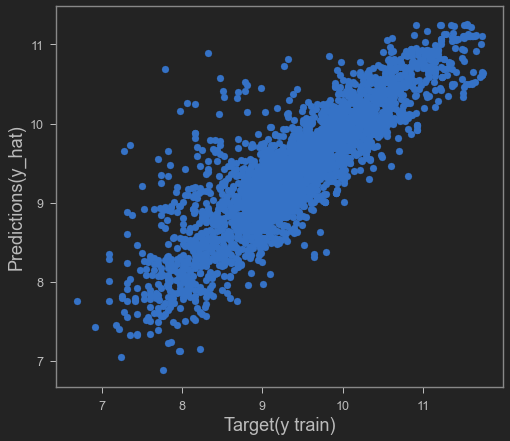

In [168]:
plt.scatter(y_train, y_hat)
plt.xlabel('Target(y train)',size = 18)
plt.ylabel('Predictions(y_hat)',size = 18)
# Our targets & Predictions are linear so our model is performing quite well

In [169]:
# Residual Plot - Difference between targets & predictions
# As per normaliity & homoscdasticity 
# Our errors are normally distributed
# Mean is zero as ell

<AxesSubplot:xlabel='log_price', ylabel='Count'>

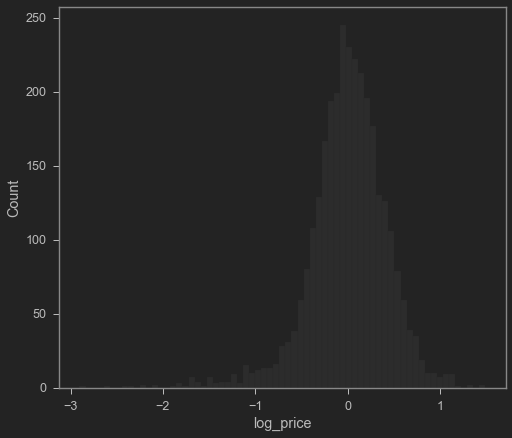

In [170]:
sns.histplot(y_train-y_hat)

In [171]:
# Calculating the R squared 
lm.score(x_train,y_train)
# Our model is explaining 75% of the variability of the data

0.7576266750713831

In [172]:
reg_summary = pd.DataFrame(data = inputs.columns.values, columns=['Features'])
reg_summary['Weights'] = lm.coef_
reg_summary
# Few weights are positive and few are -gative that means directly proportional and inversally proportions
# Higher the Engine volumn higher the price 
# Higher the mileage lower the price 

,Features,Weights
0,Mileage,-0.463901
1,EngineV,0.209142
2,Brand_BMW,0.024064
3,Brand_Mercedes-Benz,0.012525
4,Brand_Mitsubishi,-0.129988
5,Brand_Renault,-0.184112
6,Brand_Toyota,-0.053414
7,Brand_Volkswagen,-0.082238
8,Body_hatch,-0.145485
9,Body_other,-0.106758


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'Mileage'),
  Text(1, 0, 'EngineV'),
  Text(2, 0, 'Brand_BMW'),
  Text(3, 0, 'Brand_Mercedes-Benz'),
  Text(4, 0, 'Brand_Mitsubishi'),
  Text(5, 0, 'Brand_Renault'),
  Text(6, 0, 'Brand_Toyota'),
  Text(7, 0, 'Brand_Volkswagen'),
  Text(8, 0, 'Body_hatch'),
  Text(9, 0, 'Body_other'),
  Text(10, 0, 'Body_sedan'),
  Text(11, 0, 'Body_vagon'),
  Text(12, 0, 'Body_van'),
  Text(13, 0, 'Engine Type_Gas'),
  Text(14, 0, 'Engine Type_Other'),
  Text(15, 0, 'Engine Type_Petrol'),
  Text(16, 0, 'Registration_yes')])

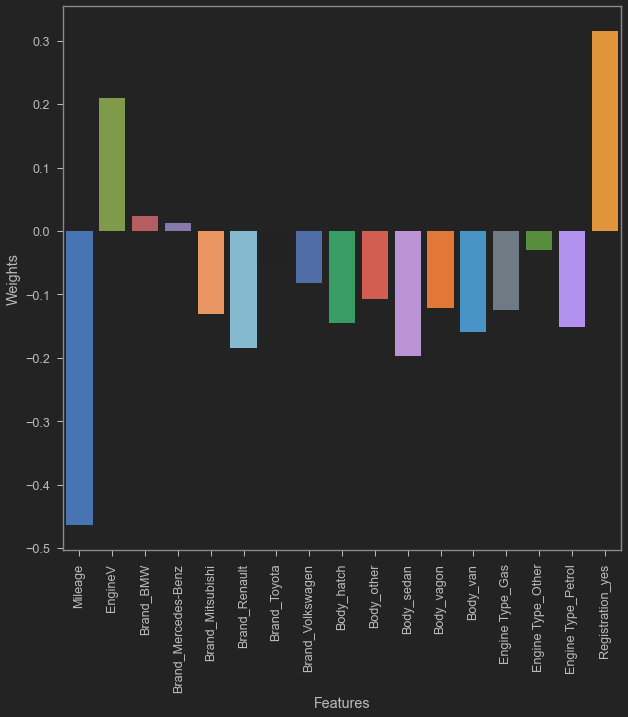

In [173]:
plt.figure(figsize = (10,10))
sns.barplot(data  = reg_summary, x = 'Features', y = 'Weights')


#sns.countplot(x= 'Make',data = data,order=data['Make'].value_counts().index)
plt.xticks(rotation=90)

In [174]:
car_data_clean['Brand'].unique()
# Missing is Audi that means when all other brands are zero
# then its the data for audi as audi is 1 then 
# Hence our benchmark is Audi
# A positive weight  shows that the respective category (Brand) is more expensive than the benchmark Audi
# A negative weight  shows that the respective category (Brand) is less expensive than the benchmark Audi
# If the car is BMW then it would be costly then compared to if teh car is Mitsubishi

array(['BMW', 'Mercedes-Benz', 'Audi', 'Toyota', 'Renault', 'Volkswagen',
       'Mitsubishi'], dtype=object)

In [175]:
car_data_clean['Brand'].value_counts()

Volkswagen       848
Mercedes-Benz    755
BMW              624
Toyota           498
Renault          432
Audi             408
Mitsubishi       302
Name: Brand, dtype: int64

In [176]:
# If we wnat to find out the significance of variables then take the absolute values of the weights of the variables 
# to compare.
# Bigger the weight bigger the impact on the target variables

# Mileage	-0.479071
# EngineV	0.255383
# Mileage is more prominent feature compared to engine volumn
# Dummies variables can't be compared with other variables with continuous values
# Dummies should be compared with its bencmark dummmy. Brands with Audi

In [177]:
# Testing Our Model

In [178]:
y_hat_test = lm.predict(x_test)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



[Text(0.5, 1.0, 'Regression Model'),
 Text(0.5, 0, 'Predicted Price'),
 Text(0, 0.5, 'Actual Price')]

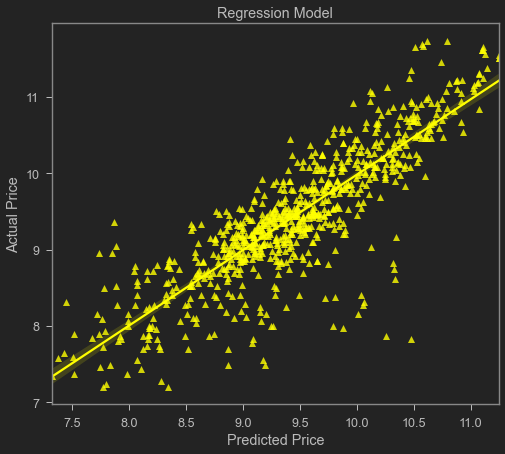

In [179]:
fig = sns.regplot(y_hat_test, y_test, color = 'yellow',marker = '^')
fig.set(title = 'Regression Model',xlabel = 'Predicted Price',ylabel= 'Actual Price')

In [180]:
# R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent 
# variable that's explained by an independent variable or variables in a regression model.
#  Whereas correlation explains the strength of the relationship between an independent and dependent variable, 
# R-squared explains to what extent the variance of one variable explains the variance of the second variable. 
# So, if the R2 of a model is 0.50, then approximately half of the observed variation can be explained by the model's inputs.
r2 = r2_score(y_test,y_hat_test)
r2

0.7236987054724251

(6.0, 13.0)

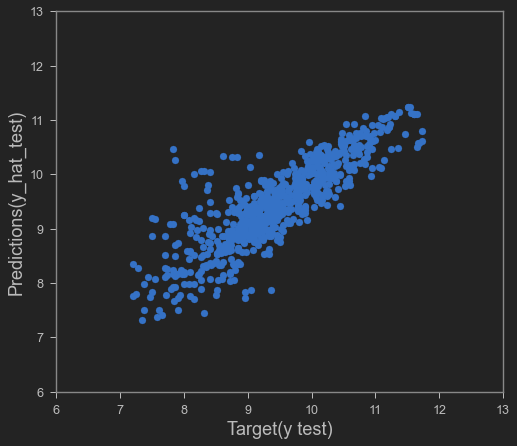

In [181]:
plt.scatter(y_test, y_hat_test)
plt.xlabel('Target(y test)',size = 18)
plt.ylabel('Predictions(y_hat_test)',size = 18)
plt.xlim(6,13)
plt.ylim(6,13)

In [182]:
# Our model is very good at predicting higher prices . values are closely packed. as values are almost on 45 degree line. 
# but not so good at predicting values are lower price values are scattered

(6.0, 13.0)

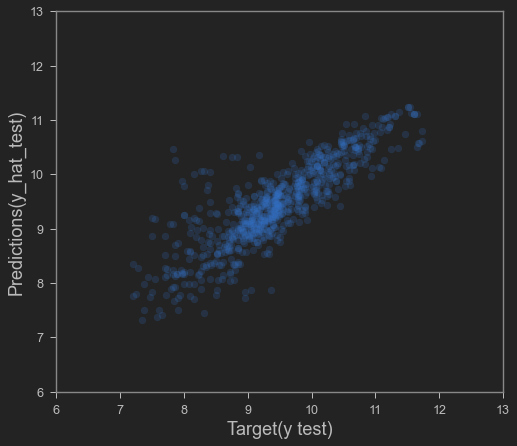

In [183]:
plt.scatter(y_test, y_hat_test, alpha=0.2)
plt.xlabel('Target(y test)',size = 18)
plt.ylabel('Predictions(y_hat_test)',size = 18)
plt.xlim(6,13)
plt.ylim(6,13)

In [184]:
df_prf = pd.DataFrame(y_hat_test, columns=['Predictions'])

In [185]:
df_prf.head()

,Predictions
0,10.712764
1,8.063161
2,10.871421
3,8.538552
4,9.650225


In [186]:
# Getting the actual values not the log values.
# So we have to take opposite of log that is exponential 
df_prf = pd.DataFrame(np.exp(y_hat_test), columns=['Predictions'])
df_prf.head()

,Predictions
0,44925.630749
1,3175.310136
2,52649.956216
3,5107.942557
4,15525.285083


In [187]:
df_prf['Target'] = np.exp(y_test)

In [188]:
df_prf
# Lot of nulls as we have lot of indexes after the split into test. Original indexes were preserved

,Predictions,Target
0,44925.630749,NaN
1,3175.310136,7900.00
2,52649.956216,NaN
3,5107.942557,NaN
4,15525.285083,18300.00
5,8870.778066,6100.00
6,21150.043740,NaN
7,10036.998625,NaN
8,39958.498881,NaN
9,19540.661944,NaN


In [189]:
y_test

514     10.849337
621      8.536996
2504    11.211820
3758     9.259131
3044     9.169518
2561     9.164820
1013    10.330388
663      9.071078
1501    10.491274
1923     7.972466
1116     8.665613
2554    10.725468
1839     9.852194
1290     8.682708
775      9.392662
1789     9.425452
1368     9.629051
2724     8.070906
2892     9.305560
1093     9.928180
1703     8.507143
453      9.994242
88       8.318498
3311    11.665647
1248     7.495542
1380    10.085767
1140    10.252382
33       8.699515
918      9.928180
2806     9.487972
3400     8.824678
3276    11.196844
2621     8.853523
3540    10.537415
1351     8.411833
499      9.417355
533     10.460242
2476    11.608227
3755     7.863267
1793     8.116716
2410     9.200290
955      8.160518
2537     9.539644
2306     8.999619
2426    10.146434
1654     9.487972
2000     7.244228
1317     7.279319
2534     9.011889
706      9.836279
938      8.699515
1535    10.680516
1748     9.303303
2831    10.085809
1580     9.536041
298      8

In [190]:
y_test = y_test.reset_index(drop=True)
y_test.head()

0    10.849337
1     8.536996
2    11.211820
3     9.259131
4     9.169518
Name: log_price, dtype: float64

In [191]:
df_prf['Target'] = np.exp(y_test)

In [192]:
df_prf

,Predictions,Target
0,44925.630749,51500.00
1,3175.310136,5100.00
2,52649.956216,74000.00
3,5107.942557,10500.00
4,15525.285083,9600.00
5,8870.778066,9555.00
6,21150.043740,30650.00
7,10036.998625,8700.00
8,39958.498881,36000.00
9,19540.661944,2900.00


In [193]:
df_prf['Residual'] = df_prf['Target'] - df_prf['Predictions']

In [194]:
df_prf

,Predictions,Target,Residual
0,44925.630749,51500.00,6574.369251
1,3175.310136,5100.00,1924.689864
2,52649.956216,74000.00,21350.043784
3,5107.942557,10500.00,5392.057443
4,15525.285083,9600.00,-5925.285083
5,8870.778066,9555.00,684.221934
6,21150.043740,30650.00,9499.956260
7,10036.998625,8700.00,-1336.998625
8,39958.498881,36000.00,-3958.498881
9,19540.661944,2900.00,-16640.661944


In [195]:
df_prf['Difference_%'] = df_prf['Residual']/df_prf['Target']*100

In [196]:
df_prf

,Predictions,Target,Residual,Difference_%
0,44925.630749,51500.00,6574.369251,12.765766
1,3175.310136,5100.00,1924.689864,37.739017
2,52649.956216,74000.00,21350.043784,28.851411
3,5107.942557,10500.00,5392.057443,51.352928
4,15525.285083,9600.00,-5925.285083,-61.721720
5,8870.778066,9555.00,684.221934,7.160878
6,21150.043740,30650.00,9499.956260,30.994963
7,10036.998625,8700.00,-1336.998625,-15.367800
8,39958.498881,36000.00,-3958.498881,-10.995830
9,19540.661944,2900.00,-16640.661944,-573.815929


In [197]:
df_prf['Difference_%'] = np.absolute(df_prf['Residual']/df_prf['Target']*100)

In [198]:
df_prf

,Predictions,Target,Residual,Difference_%
0,44925.630749,51500.00,6574.369251,12.765766
1,3175.310136,5100.00,1924.689864,37.739017
2,52649.956216,74000.00,21350.043784,28.851411
3,5107.942557,10500.00,5392.057443,51.352928
4,15525.285083,9600.00,-5925.285083,61.721720
5,8870.778066,9555.00,684.221934,7.160878
6,21150.043740,30650.00,9499.956260,30.994963
7,10036.998625,8700.00,-1336.998625,15.367800
8,39958.498881,36000.00,-3958.498881,10.995830
9,19540.661944,2900.00,-16640.661944,573.815929


In [199]:
df_prf.describe()

,Predictions,Target,Residual,Difference_%
count,774.000000,774.000000,774.000000,774.000000
mean,16851.598471,18731.353863,1879.755392,41.313210
std,13535.510443,19706.068344,10659.350296,86.034549
min,1512.638370,1350.000000,-32935.441171,0.044402
25%,7908.913803,7325.000000,-2254.101254,10.942371
50%,12375.321233,11900.000000,196.762631,22.211948
75%,21574.973850,23300.000000,3178.104474,40.681136
max,76599.484887,125000.000000,84305.778856,1317.417647


In [200]:
df_prf.sort_values(by = ['Difference_%'])

,Predictions,Target,Residual,Difference_%
626,17631.637668,17639.47,7.832332,0.044402
327,7806.298291,7800.00,-6.298291,0.080747
493,42972.483348,42900.00,-72.483348,0.168959
138,11520.275427,11500.00,-20.275427,0.176308
739,10219.722458,10200.00,-19.722458,0.193357
432,32918.164521,33000.00,81.835479,0.247986
451,9661.052264,9700.00,38.947736,0.401523
526,22593.803704,22500.00,-93.803704,0.416905
356,11754.315291,11700.00,-54.315291,0.464233
210,18697.551382,18600.00,-97.551382,0.524470


In [201]:
pd.options.display.max_rows = 999
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_prf.sort_values(by = ['Difference_%'])

,Predictions,Target,Residual,Difference_%
626,17631.64,17639.47,7.83,0.04
327,7806.30,7800.00,-6.30,0.08
493,42972.48,42900.00,-72.48,0.17
138,11520.28,11500.00,-20.28,0.18
739,10219.72,10200.00,-19.72,0.19
432,32918.16,33000.00,81.84,0.25
451,9661.05,9700.00,38.95,0.40
526,22593.80,22500.00,-93.80,0.42
356,11754.32,11700.00,-54.32,0.46
210,18697.55,18600.00,-97.55,0.52


In [202]:
# MSE = mean_squared_error(y_actual, y_predicted)
MSE = mean_squared_error(df_prf['Target'], df_prf['Predictions'])
MSE

117008430.95309582

In [203]:
RMSE = np.sqrt(MSE)
print("Root Mean Square Error:\n")
print(RMSE)
# Usually, a RMSE score of less than 180 is considered a good score for a moderately or well working algorithm.
# In case, the RMSE value exceeds 180, we need to perform feature selection and hyper parameter tuning on the 
# parameters of the model.

Root Mean Square Error:

10817.043540316172


<AxesSubplot:xlabel='Target', ylabel='Density'>

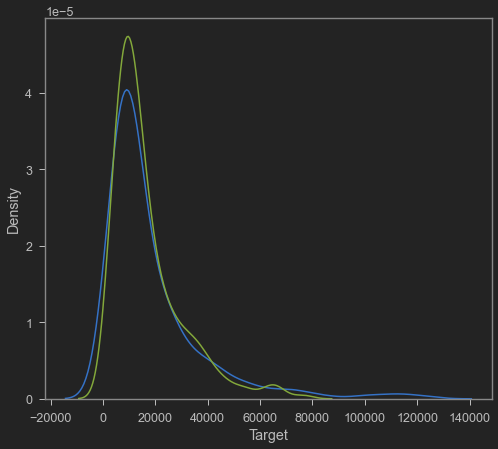

In [204]:
sns.kdeplot(df_prf['Target'])
sns.kdeplot(df_prf['Predictions'])